# Assignment 3: Clustering
**Course Code:** MECS1033-01

**Name:** Bakunga Bronson

**Matric No:** MCS232006

# Data Loading

In [1]:
import pandas as pd
from sklearn.cluster import KMeans
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist, cdist
from sklearn.metrics import silhouette_score


In [2]:
# Read the Online Retail dataset
df = pd.read_excel("Online Retail.xlsx")

In [3]:
# Show the records in the data frame
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [4]:
# Shape of the data
df.shape

(541909, 8)

In [5]:
# Print the column names to see if they have spaces in them
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [6]:
# Check the data types
df.dtypes

InvoiceNo              object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID            float64
Country                object
dtype: object

In [7]:
# Check the maximum number of items purchased
print(f"Maximum number of items purchaesed at once: {df['Quantity'].max()}")

Maximum number of items purchaesed at once: 80995


In [8]:
df.query("Quantity == 80995")

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2011-12-09 09:15:00,2.08,16446.0,United Kingdom


In [9]:
# Optimize data types
df["Quantity"] = df["Quantity"].astype("int32")

df["StockCode"] = df["StockCode"].astype("category")
df["Description"] = df["Description"].astype("category")
df["Country"] = df["Country"].astype("category")

In [10]:
df.dtypes

InvoiceNo              object
StockCode            category
Description          category
Quantity                int32
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID            float64
Country              category
dtype: object

In [11]:
# Checking for missing values
df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [12]:
# Exploring reported missing values
mask = df.isnull().any(axis=1)
# Print the first 10 entries
df[mask].head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,2010-12-01 14:32:00,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,2010-12-01 14:32:00,1.66,NaN,United Kingdom
1447,536544,21790,VINTAGE SNAP CARDS,9,2010-12-01 14:32:00,1.66,NaN,United Kingdom
1448,536544,21791,VINTAGE HEADS AND TAILS CARD GAME,2,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1449,536544,21801,CHRISTMAS TREE DECORATION WITH BELL,10,2010-12-01 14:32:00,0.43,NaN,United Kingdom
1450,536544,21802,CHRISTMAS TREE HEART DECORATION,9,2010-12-01 14:32:00,0.43,NaN,United Kingdom
1451,536544,21803,CHRISTMAS TREE STAR DECORATION,11,2010-12-01 14:32:00,0.43,NaN,United Kingdom


**NOTE:** We see that even though the website claims to have no missing values, there are missing values and we must handle them.

In [13]:
# Drop rows with missing values since they cannot be easily filled
df.dropna(inplace=True)

**Note:** We have no missing values now

In [14]:
# New shape
df.shape

(406829, 8)

In [15]:
# Checking for duplicates
df.duplicated().sum()

5225

In [16]:
# Dropping duplicates
df.drop_duplicates(inplace=True)

In [17]:
# Checking for duplicates again
df.duplicated().sum()

0

# Picking an application for the clustering algorithm
We want to understand the behavior of customers based on the items they bought. We therefore will create a pivot table with only the data we need.

In [18]:
# Creating a pivot table
customer_product_matrix = df.pivot_table(index='CustomerID', columns='Description', values='Quantity', aggfunc='sum', fill_value=0)

In [19]:
customer_product_matrix.describe()

Description,20713,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,...,wrongly coded 20713,wrongly coded 23343,wrongly coded-23343,wrongly marked,wrongly marked 23343,wrongly marked carton 22804,wrongly marked. 23343 in box,wrongly sold (22719) barcode,wrongly sold as sets,wrongly sold sets
count,4372.0,4372.000000,4372.000000,4372.000000,4372.000000,4372.000000,4372.000000,4372.000000,4372.000000,4372.000000,...,4372.0,4372.0,4372.0,4372.0,4372.0,4372.0,4372.0,4372.0,4372.0,4372.0
mean,0.0,0.031565,0.430695,0.545974,0.082113,0.000229,0.012351,0.026532,0.385636,0.597667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.585738,6.534529,18.516879,1.709082,0.015124,0.186070,0.453493,6.589542,11.864341,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,0.0,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,0.0,24.000000,400.000000,1201.000000,100.000000,1.000000,6.000000,24.000000,400.000000,600.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
from sklearn.preprocessing import StandardScaler

# Standardizing the dataset
scaler_small = StandardScaler()
customer_product_matrix.columns = customer_product_matrix.columns.astype(str)
customer_product_matrix_scaled = scaler_small.fit_transform(customer_product_matrix)

# K-Means Clustering

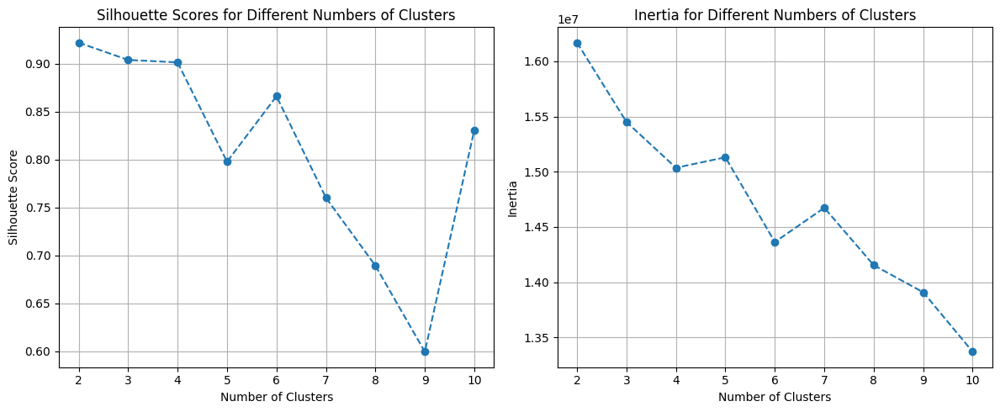

In [21]:
import matplotlib.pyplot as plt

silhouette_scores = []
inertia_values = []

for i in range(2, 11):
    kmeans = KMeans(n_init=10, n_clusters=i, random_state=42)
    kmeans.fit(customer_product_matrix_scaled)
    score = silhouette_score(customer_product_matrix_scaled, kmeans.labels_)
    silhouette_scores.append(score)
    inertia_values.append(kmeans.inertia_)

# Plotting the Silhouette scores
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Scores for Different Numbers of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(range(2, 11))
plt.grid(True)

# Plotting the inertia values
plt.subplot(1, 2, 2)
plt.plot(range(2, 11), inertia_values, marker='o', linestyle='--')
plt.title('Inertia for Different Numbers of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(range(2, 11))
plt.grid(True)

plt.tight_layout()
plt.show()


In [22]:
# Display the list of inertia and silhouette score for each k
scores_df = pd.DataFrame({'K': range(2, 11), 'Inertia': inertia_values, 'Silhouette Score': silhouette_scores})
print(scores_df)

    K       Inertia  Silhouette Score
0   2  1.616906e+07          0.922026
1   3  1.545036e+07          0.903997
2   4  1.503622e+07          0.901459
3   5  1.513115e+07          0.797791
4   6  1.436388e+07          0.866097
5   7  1.467375e+07          0.760242
6   8  1.415394e+07          0.689399
7   9  1.390913e+07          0.599587
8  10  1.337061e+07          0.830832


**NOTE:** Based on the above visualizations we can see that k=4 would be a great value to use.

In [23]:
# Apply K as 4 for the clusters
kmeans = KMeans(n_init=10, n_clusters=4, random_state=42)
kmeans.fit(customer_product_matrix_scaled)

KMeans(n_clusters=4, n_init=10, random_state=42)

In [24]:
# Get the cluster centers
cluster_centers = kmeans.cluster_centers_

# Assign clusters to data points
labels = kmeans.labels_

customer_product_matrix['Cluster'] = labels

print(customer_product_matrix['Cluster'].value_counts())

1    4367
0       3
3       1
2       1
Name: Cluster, dtype: int64


In [25]:
# Displaying cluster 1
customer_product_matrix[customer_product_matrix['Cluster'] == 0]

Description,20713,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,...,wrongly coded 23343,wrongly coded-23343,wrongly marked,wrongly marked 23343,wrongly marked carton 22804,wrongly marked. 23343 in box,wrongly sold (22719) barcode,wrongly sold as sets,wrongly sold sets,Cluster
CustomerID,,,,,,,,,,,,,,,,,,,,,
13694.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14298.0,0,0,0,0,0,0,0,24,0,0,...,0,0,0,0,0,0,0,0,0,0
17511.0,0,0,0,12,12,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [26]:
# Displaying cluster 2
customer_product_matrix[customer_product_matrix['Cluster'] == 1]

Description,20713,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,...,wrongly coded 23343,wrongly coded-23343,wrongly marked,wrongly marked 23343,wrongly marked carton 22804,wrongly marked. 23343 in box,wrongly sold (22719) barcode,wrongly sold as sets,wrongly sold sets,Cluster
CustomerID,,,,,,,,,,,,,,,,,,,,,
12346.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12347.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12348.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12349.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12350.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18280.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
18281.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
18282.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [27]:
# Displaying cluster 3
customer_product_matrix[customer_product_matrix['Cluster'] == 2]

Description,20713,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,...,wrongly coded 23343,wrongly coded-23343,wrongly marked,wrongly marked 23343,wrongly marked carton 22804,wrongly marked. 23343 in box,wrongly sold (22719) barcode,wrongly sold as sets,wrongly sold sets,Cluster
CustomerID,,,,,,,,,,,,,,,,,,,,,
14911.0,0,0,48,24,0,0,2,7,48,0,...,0,0,0,0,0,0,0,0,0,2


In [28]:
# Displaying cluster 4
customer_product_matrix[customer_product_matrix['Cluster'] == 3]

Description,20713,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,...,wrongly coded 23343,wrongly coded-23343,wrongly marked,wrongly marked 23343,wrongly marked carton 22804,wrongly marked. 23343 in box,wrongly sold (22719) barcode,wrongly sold as sets,wrongly sold sets,Cluster
CustomerID,,,,,,,,,,,,,,,,,,,,,
14646.0,0,0,0,1201,100,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3


In [29]:
# Set option to display all columns (None means unlimited)
pd.set_option('display.max_columns', None)

# Exploring Cluster 1
customer_product_matrix[customer_product_matrix['Cluster'] == 0].describe()

Description  20713   4 PURPLE FLOCK DINNER CANDLES  \
count          3.0                             3.0   
mean           0.0                             0.0   
std            0.0                             0.0   
min            0.0                             0.0   
25%            0.0                             0.0   
50%            0.0                             0.0   
75%            0.0                             0.0   
max            0.0                             0.0   

Description   50'S CHRISTMAS GIFT BAG LARGE   DOLLY GIRL BEAKER  \
count                                   3.0            3.000000   
mean                                    0.0            4.000000   
std                                     0.0            6.928203   
min                                     0.0            0.000000   
25%                                     0.0            0.000000   
50%                                     0.0            0.000000   
75%                                     0.0            6.000000   
max                                     0.0           12.000000   

Description   I LOVE LONDON MINI BACKPACK   I LOVE LONDON MINI RUCKSACK  \
count                            3.000000                           3.0   
mean                             4.000000                           0.0   
std                              6.928203                           0.0   
min                              0.000000                           0.0   
25%                              0.000000                           0.0   
50%                              0.000000                           0.0   
75%                              6.000000                           0.0   
max                             12.000000                           0.0   

Description   NINE DRAWER OFFICE TIDY   OVAL WALL MIRROR DIAMANTE   \
count                             3.0                     3.000000   
mean                              0.0                     8.000000   
std                               0.0                    13.856406   
min                               0.0                     0.000000   
25%                               0.0                     0.000000   
50%                               0.0                     0.000000   
75%                               0.0                    12.000000   
max                               0.0                    24.000000   

Description   RED SPOT GIFT BAG LARGE   SET 2 TEA TOWELS I LOVE LONDON   \
count                             3.0                               3.0   
mean                              0.0                               0.0   
std                               0.0                               0.0   
min                               0.0                               0.0   
25%                               0.0                               0.0   
50%                               0.0                               0.0   
75%                               0.0                               0.0   
max                               0.0                               0.0   

Description   SPACEBOY BABY GIFT SET   TOADSTOOL BEDSIDE LIGHT   \
count                       3.000000                        3.0   
mean                        0.333333                        0.0   
std                         0.577350                        0.0   
min                         0.000000                        0.0   
25%                         0.000000                        0.0   
50%                         0.000000                        0.0   
75%                         0.500000                        0.0   
max                         1.000000                        0.0   

Description   TRELLIS COAT RACK  *Boombox Ipod Classic  \
count                  3.000000                    3.0   
mean                  16.000000                    0.0   
std                   27.712813                    0.0   
min                    0.000000                    0.0   
25%                    0.000000 

In [30]:
# Exploring Cluster 2
customer_product_matrix[customer_product_matrix['Cluster'] == 1].describe()

Description   20713   4 PURPLE FLOCK DINNER CANDLES  \
count        4367.0                     4367.000000   
mean            0.0                        0.031601   
std             0.0                        0.586073   
min             0.0                        0.000000   
25%             0.0                        0.000000   
50%             0.0                        0.000000   
75%             0.0                        0.000000   
max             0.0                       24.000000   

Description   50'S CHRISTMAS GIFT BAG LARGE   DOLLY GIRL BEAKER  \
count                           4367.000000         4367.000000   
mean                               0.420197            0.263339   
std                                6.498492            3.600057   
min                                0.000000           -1.000000   
25%                                0.000000            0.000000   
50%                                0.000000            0.000000   
75%                                0.000000            0.000000   
max                              400.000000          200.000000   

Description   I LOVE LONDON MINI BACKPACK   I LOVE LONDON MINI RUCKSACK  \
count                         4367.000000                        4367.0   
mean                             0.056561                           0.0   
std                              0.777464                           0.0   
min                              0.000000                           0.0   
25%                              0.000000                           0.0   
50%                              0.000000                           0.0   
75%                              0.000000                           0.0   
max                             40.000000                           0.0   

Description   NINE DRAWER OFFICE TIDY   OVAL WALL MIRROR DIAMANTE   \
count                     4367.000000                  4367.000000   
mean                         0.011907                     0.019464   
std                          0.183729                     0.251129   
min                          0.000000                     0.000000   
25%                          0.000000                     0.000000   
50%                          0.000000                     0.000000   
75%                          0.000000                     0.000000   
max                          6.000000                     7.000000   

Description   RED SPOT GIFT BAG LARGE   SET 2 TEA TOWELS I LOVE LONDON   \
count                     4367.000000                       4367.000000   
mean                         0.375086                          0.598351   
std                          6.553798                         11.871116   
min                          0.000000                          0.000000   
25%                          0.000000                          0.000000   
50%                          0.000000                          0.000000   
75%                          0.000000                          0.000000   
max                        400.000000                        600.000000   

Description   SPACEBOY BABY GIFT SET   TOADSTOOL BEDSIDE LIGHT   \
count                    4367.000000                4367.000000   
mean                        0.091596                   0.000458   
std                         1.200031                   0.030265   
min                         0.000000                   0.000000   
25%                         0.000000                   0.000000   
50%                         0.000000                   0.000000   
75%                         0.000000                   0.000000   
max                        54.000000                   2.000000   

Description   TRELLIS COAT RACK  *Boombox Ipod Classic  \
count               4367.000000                 4367.0   
mean                   0.035722                    0.0   
std                    0.542814                    0.0   
min                    0.000000                    0.0   
25%                    

In [31]:
# Exploring Cluster 3
customer_product_matrix[customer_product_matrix['Cluster'] == 2].describe()

Description  20713   4 PURPLE FLOCK DINNER CANDLES  \
count          1.0                             1.0   
mean           0.0                             0.0   
std            NaN                             NaN   
min            0.0                             0.0   
25%            0.0                             0.0   
50%            0.0                             0.0   
75%            0.0                             0.0   
max            0.0                             0.0   

Description   50'S CHRISTMAS GIFT BAG LARGE   DOLLY GIRL BEAKER  \
count                                   1.0                 1.0   
mean                                   48.0                24.0   
std                                     NaN                 NaN   
min                                    48.0                24.0   
25%                                    48.0                24.0   
50%                                    48.0                24.0   
75%                                    48.0                24.0   
max                                    48.0                24.0   

Description   I LOVE LONDON MINI BACKPACK   I LOVE LONDON MINI RUCKSACK  \
count                                 1.0                           1.0   
mean                                  0.0                           0.0   
std                                   NaN                           NaN   
min                                   0.0                           0.0   
25%                                   0.0                           0.0   
50%                                   0.0                           0.0   
75%                                   0.0                           0.0   
max                                   0.0                           0.0   

Description   NINE DRAWER OFFICE TIDY   OVAL WALL MIRROR DIAMANTE   \
count                             1.0                          1.0   
mean                              2.0                          7.0   
std                               NaN                          NaN   
min                               2.0                          7.0   
25%                               2.0                          7.0   
50%                               2.0                          7.0   
75%                               2.0                          7.0   
max                               2.0                          7.0   

Description   RED SPOT GIFT BAG LARGE   SET 2 TEA TOWELS I LOVE LONDON   \
count                             1.0                               1.0   
mean                             48.0                               0.0   
std                               NaN                               NaN   
min                              48.0                               0.0   
25%                              48.0                               0.0   
50%                              48.0                               0.0   
75%                              48.0                               0.0   
max                              48.0                               0.0   

Description   SPACEBOY BABY GIFT SET   TOADSTOOL BEDSIDE LIGHT   \
count                            1.0                        1.0   
mean                             6.0                        0.0   
std                              NaN                        NaN   
min                              6.0                        0.0   
25%                              6.0                        0.0   
50%                              6.0                        0.0   
75%                              6.0                        0.0   
max                              6.0                        0.0   

Description   TRELLIS COAT RACK  *Boombox Ipod Classic  \
count                       1.0                    1.0   
mean                       12.0                    0.0   
std                         NaN                    NaN   
min                        12.0                    0.0   
25%                        12.0 

In [32]:
# Exploring Cluster 4
customer_product_matrix[customer_product_matrix['Cluster'] == 3].describe()

Description  20713   4 PURPLE FLOCK DINNER CANDLES  \
count          1.0                             1.0   
mean           0.0                             0.0   
std            NaN                             NaN   
min            0.0                             0.0   
25%            0.0                             0.0   
50%            0.0                             0.0   
75%            0.0                             0.0   
max            0.0                             0.0   

Description   50'S CHRISTMAS GIFT BAG LARGE   DOLLY GIRL BEAKER  \
count                                   1.0                 1.0   
mean                                    0.0              1201.0   
std                                     NaN                 NaN   
min                                     0.0              1201.0   
25%                                     0.0              1201.0   
50%                                     0.0              1201.0   
75%                                     0.0              1201.0   
max                                     0.0              1201.0   

Description   I LOVE LONDON MINI BACKPACK   I LOVE LONDON MINI RUCKSACK  \
count                                 1.0                           1.0   
mean                                100.0                           1.0   
std                                   NaN                           NaN   
min                                 100.0                           1.0   
25%                                 100.0                           1.0   
50%                                 100.0                           1.0   
75%                                 100.0                           1.0   
max                                 100.0                           1.0   

Description   NINE DRAWER OFFICE TIDY   OVAL WALL MIRROR DIAMANTE   \
count                             1.0                          1.0   
mean                              0.0                          0.0   
std                               NaN                          NaN   
min                               0.0                          0.0   
25%                               0.0                          0.0   
50%                               0.0                          0.0   
75%                               0.0                          0.0   
max                               0.0                          0.0   

Description   RED SPOT GIFT BAG LARGE   SET 2 TEA TOWELS I LOVE LONDON   \
count                             1.0                               1.0   
mean                              0.0                               0.0   
std                               NaN                               NaN   
min                               0.0                               0.0   
25%                               0.0                               0.0   
50%                               0.0                               0.0   
75%                               0.0                               0.0   
max                               0.0                               0.0   

Description   SPACEBOY BABY GIFT SET   TOADSTOOL BEDSIDE LIGHT   \
count                            1.0                        1.0   
mean                            36.0                        0.0   
std                              NaN                        NaN   
min                             36.0                        0.0   
25%                             36.0                        0.0   
50%                             36.0                        0.0   
75%                             36.0                        0.0   
max                             36.0                        0.0   

Description   TRELLIS COAT RACK  *Boombox Ipod Classic  \
count                       1.0                    1.0   
mean                        0.0                    0.0   
std                         NaN                    NaN   
min                         0.0                    0.0   
25%                         0.0 

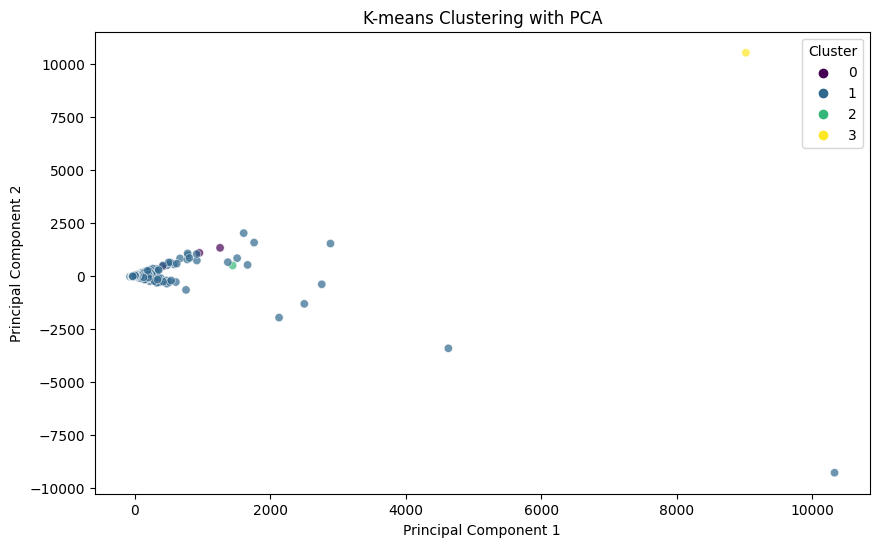

In [33]:
from sklearn.decomposition import PCA
import seaborn as sns

# Perform PCA to reduce dimensionality to 2 components
pca = PCA(n_components=2)
pca_result = pca.fit_transform(customer_product_matrix)

# Add the PCA components to the DataFrame
customer_product_matrix['pca1'] = pca_result[:, 0]
customer_product_matrix['pca2'] = pca_result[:, 1]

# Plot the clusters using PCA components
plt.figure(figsize=(10, 6))
sns.scatterplot(x='pca1', y='pca2', hue='Cluster', data=customer_product_matrix, palette='viridis', alpha=0.7)
plt.title('K-means Clustering with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()